In [24]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
%matplotlib inline

In [25]:
def display_img(img):
    fig = plt.figure(figsize=(12,10))
    ax = fig.add_subplot(111)
    ax.imshow(img, cmap='gray')

In [26]:
img = cv2.imread('../DATA/sudoku.jpg', 0)

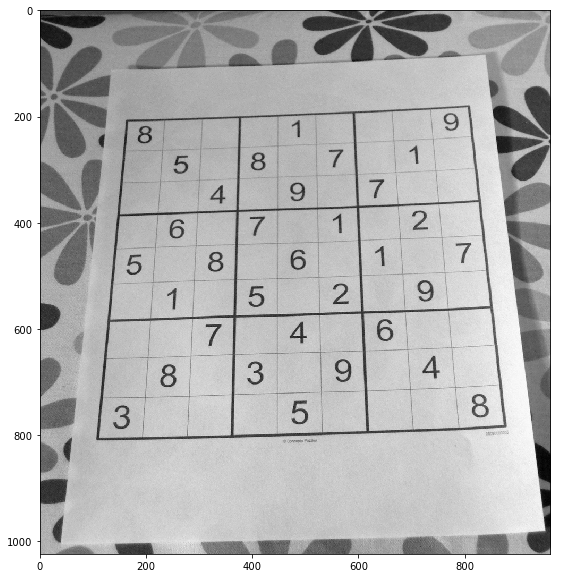

In [27]:
display_img(img)

In [28]:
sobolx = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=5)

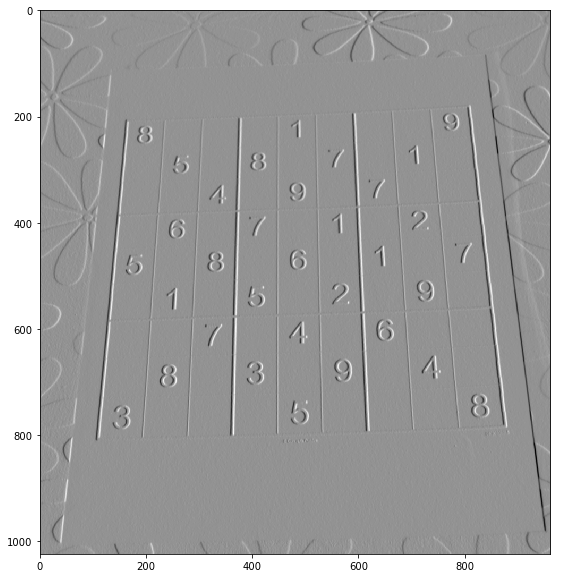

In [29]:
display_img(sobolx)

In [30]:
soboly = cv2.Sobel(src=img, ddepth=cv2.CV_64F, dx=0, dy=1, ksize=5)

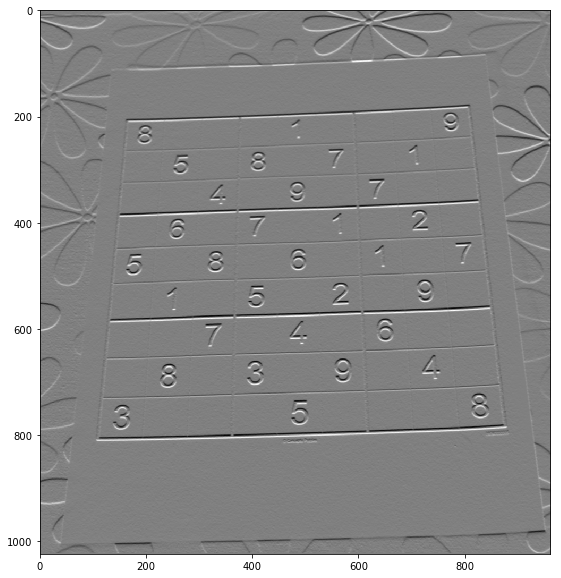

In [31]:
display_img(soboly)

In [32]:
laplacian = cv2.Laplacian(img, cv2.CV_64F)

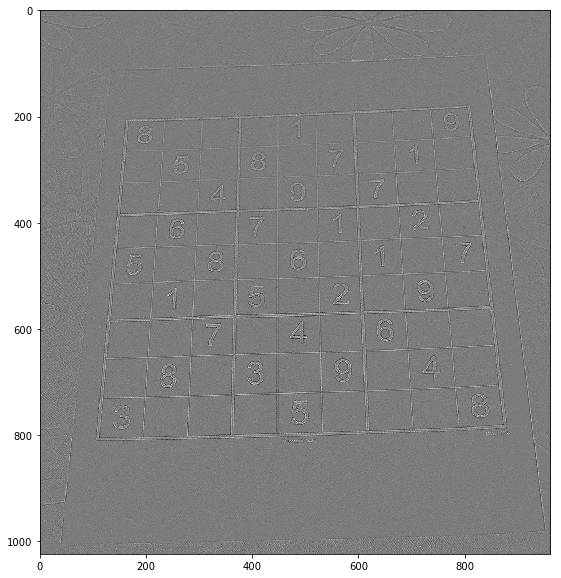

In [33]:
display_img(laplacian)

In [34]:
blended = cv2.addWeighted(src1=sobolx, alpha=0.5, src2=soboly, beta=0.5, gamma=0)

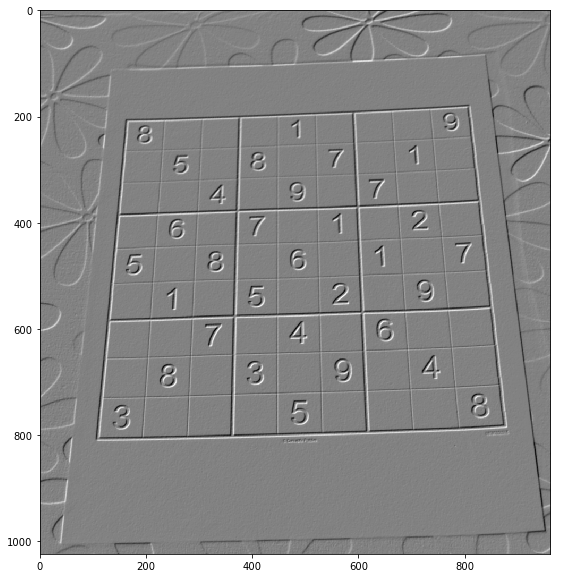

In [35]:
display_img(blended)

In [36]:
ret, th1 = cv2.threshold(src=img, thresh=127, maxval=255, type=cv2.THRESH_BINARY)

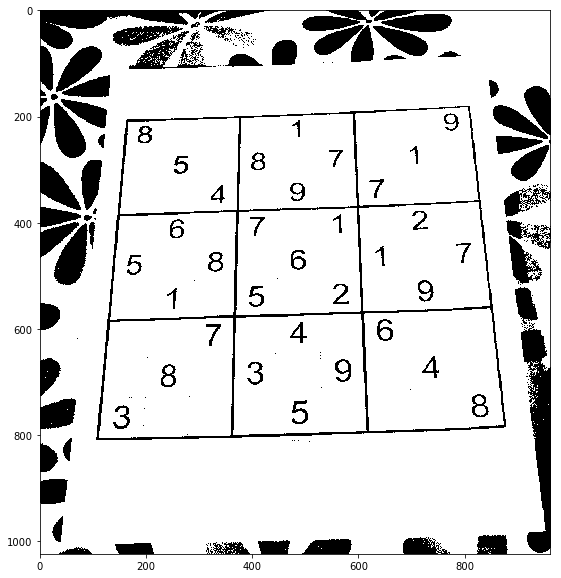

In [37]:
display_img(th1)

In [38]:
ret, th1 = cv2.threshold(src=blended, thresh=200, maxval=255, type=cv2.THRESH_BINARY_INV)

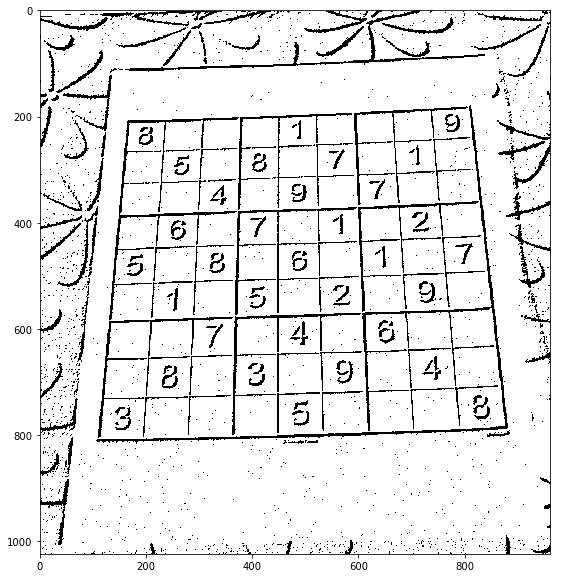

In [39]:
display_img(th1)

In [40]:
kernel = np.ones((4,4), np.uint8)
gradient = cv2.morphologyEx(src=blended, op=cv2.MORPH_GRADIENT, kernel=kernel)

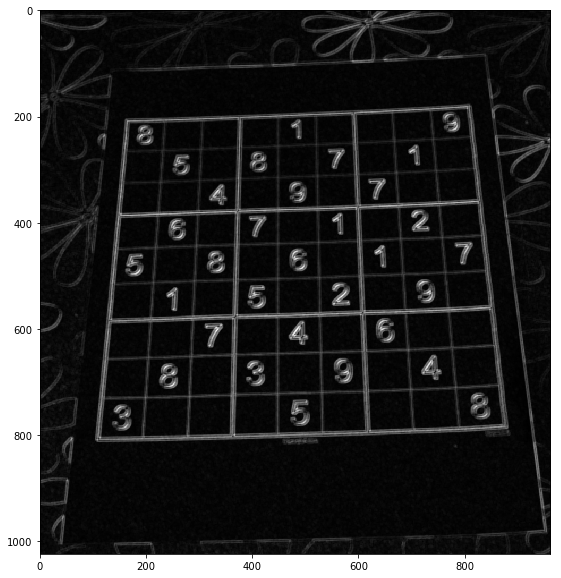

In [41]:
display_img(gradient)

In [1]:
#histograms

In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

In [7]:
dark_horse = cv2.imread('../DATA/horse.jpg')
show_horse = cv2.cvtColor(dark_horse, cv2.COLOR_BGR2RGB)

rainbow = cv2.imread('../DATA/rainbow.jpg')
show_rainbow = cv2.cvtColor(rainbow, cv2. COLOR_BGR2RGB)

blue_bricks = cv2.imread('../DATA/bricks.jpg')
show_bricks = cv2.cvtColor(blue_bricks, cv2.COLOR_BGR2RGB)

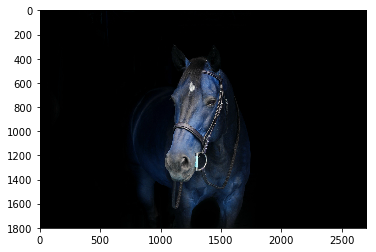

In [5]:
plt.imshow(dark_horse)

In [14]:
hist_val = cv2.calcHist(images=[blue_bricks], channels=[0], mask=None, histSize=[256], ranges=[0, 256])

In [15]:
hist_val.shape

(256, 1)

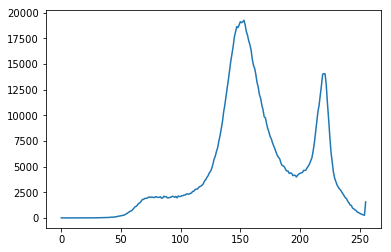

In [16]:
plt.plot(hist_val)

In [17]:
color = ('b', 'g', 'r')

In [18]:
type(color)

tuple

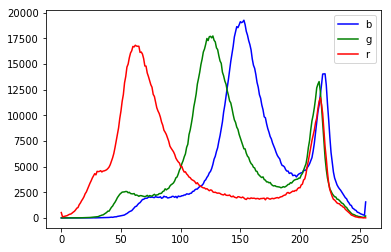

In [39]:
for i, col in enumerate(color):
    hist = cv2.calcHist(images=[blue_bricks], channels=[i],mask=None,histSize=[256], ranges=[0, 256])
    plt.plot(hist, color=col)
plt.legend(color)
plt.show()
    

In [42]:
def show_histo_bgr(img):
    color = ('b', 'g', 'r')
    for i, col in enumerate(color):
        hist = cv2.calcHist(images=[img], channels=[i],mask=None,histSize=[256], ranges=[0, 256])
        plt.plot(hist, color=col)
    plt.legend(color)
    plt.show()


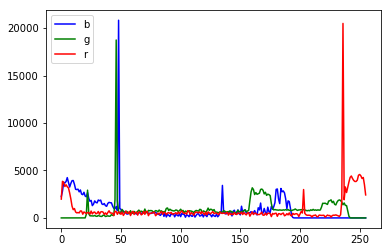

In [44]:
show_histo_bgr(rainbow)

In [45]:
def show_histo_bgr_mask(img, mask=None):
    color = ('b', 'g', 'r')
    for i, col in enumerate(color):
        hist = cv2.calcHist(images=[img], channels=[i],mask=mask,histSize=[256], ranges=[0, 256])
        plt.plot(hist, color=col)
    plt.legend(color)
    plt.show()


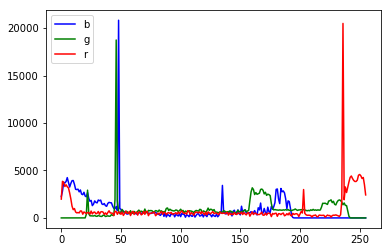

In [46]:
show_histo_bgr(rainbow)

In [67]:
img = rainbow

In [68]:
img.shape

(550, 413, 3)

In [69]:
img.shape[:2]

(550, 413)

In [70]:
mask = np.zeros(img.shape[:2], dtype=np.uint8)

In [71]:
#plt.imshow(mask, cmap='gray')
mask[300:400, 100:400] = 255

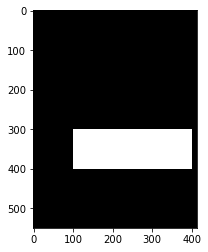

In [72]:
 plt.imshow(mask, cmap='gray')

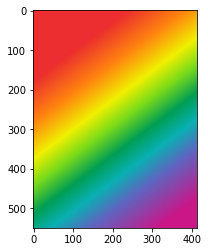

In [73]:
plt.imshow(show_rainbow)

In [80]:
mask_img = cv2.bitwise_and(src1=img, src2=img, mask=mask)
mask_img_show = cv2.bitwise_and(src1=show_rainbow, src2=show_rainbow, mask=mask)

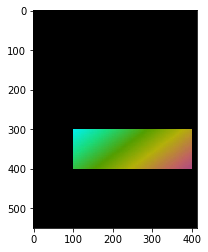

In [78]:
plt.imshow(mask_img)

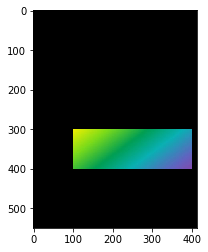

In [81]:
plt.imshow(mask_img_show)

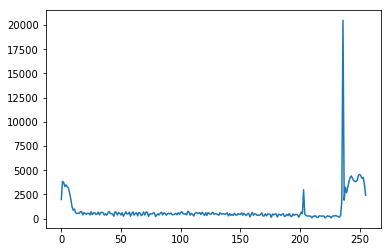

In [82]:
hist = cv2.calcHist(images=[rainbow], channels=[2], mask=None, histSize=[256], ranges=[0, 256])
plt.plot(hist)

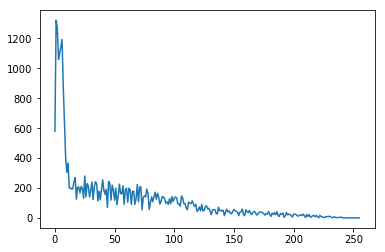

In [83]:
hist = cv2.calcHist(images=[rainbow], channels=[2], mask=mask, histSize=[256], ranges=[0, 256])
plt.plot(hist)

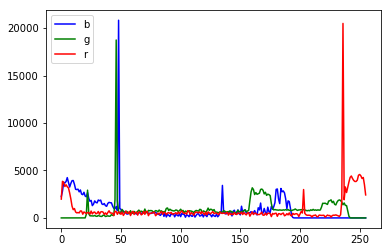

In [84]:
show_histo_bgr(rainbow)

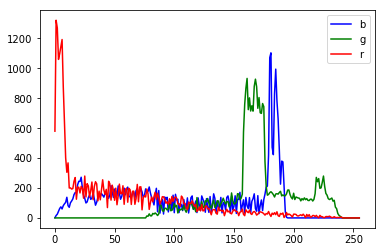

In [85]:
show_histo_bgr_mask(rainbow, mask=mask)

In [88]:
gorilla = cv2.imread('../DATA/gorilla.jpg', 0)

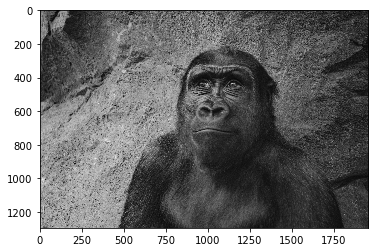

In [90]:
plt.imshow(gorilla, cmap='gray')

In [93]:
def display_img(img, cmap=None):
    fig = plt.figure(figsize=(12,10))
    ax = fig.add_subplot(111)
    ax.imshow(img, cmap)

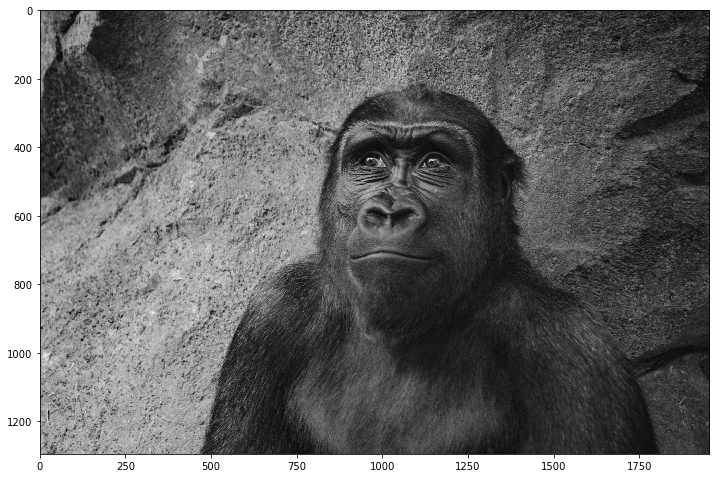

In [94]:
display_img(gorilla, cmap='gray')

In [95]:
gorilla.shape

(1295, 1955)

In [96]:
hist_values = cv2.calcHist(images=[gorilla], channels=[0], mask=None, histSize=[256], ranges=[0,256])

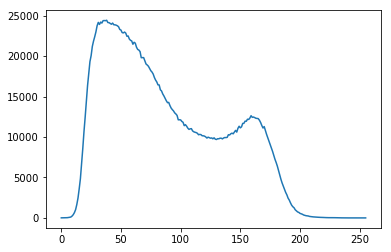

In [98]:
plt.plot(hist_values)

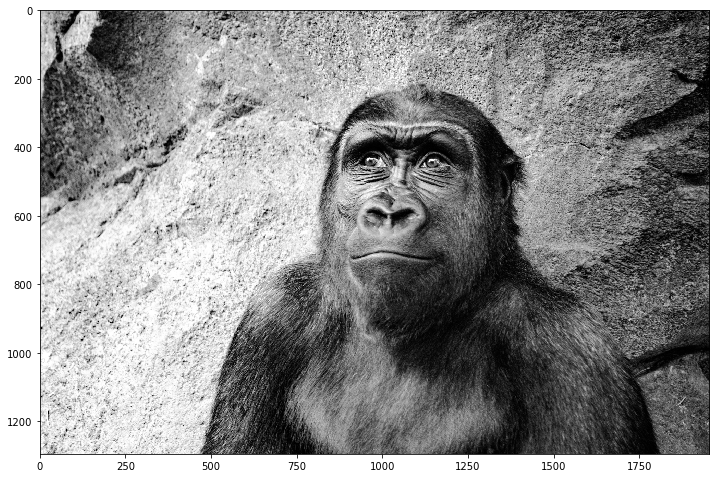

In [100]:
eq_gorilla = cv2.equalizeHist(gorilla)
display_img(eq_gorilla, cmap='gray')

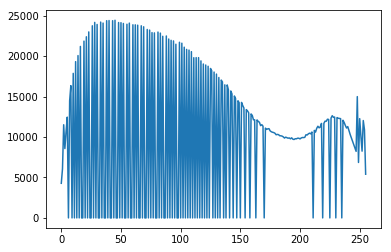

In [101]:
hist_values_eq = cv2.calcHist(images=[eq_gorilla], channels=[0], mask=None, histSize=[256], ranges=[0,256])
plt.plot(hist_values_eq)

In [102]:
color_gorilla = cv2.imread('../DATA/gorilla.jpg')
show_color_gorilla = cv2.cvtColor(color_gorilla, cv2.COLOR_BGR2RGB)

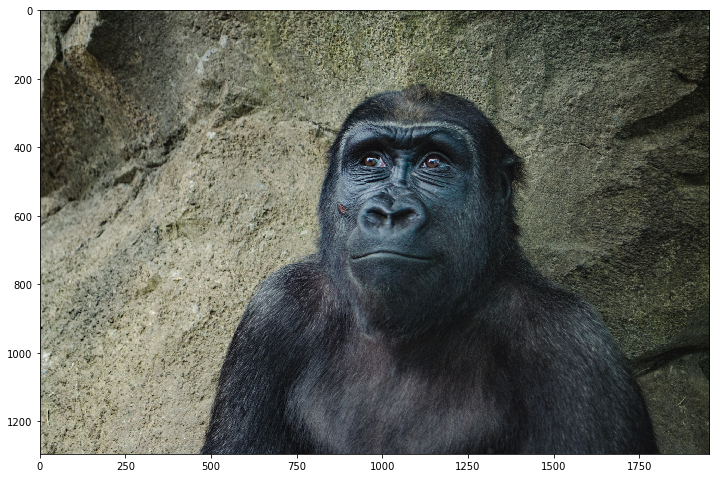

In [103]:
display_img(show_color_gorilla)

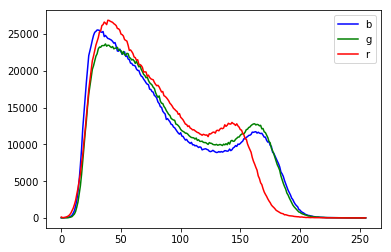

In [104]:
show_histo_bgr_mask(show_color_gorilla)

In [105]:
hsv_gorilla = cv2.cvtColor(color_gorilla, cv2.COLOR_BGR2HSV)

In [108]:
hsv_gorilla[:,:,2].max()

255

In [109]:
hsv_gorilla[:,:,2].min()

0

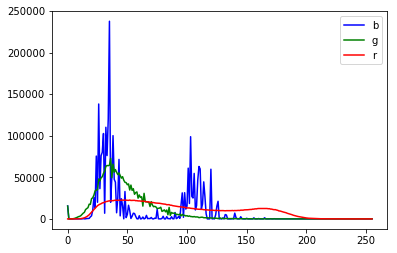

In [110]:
show_histo_bgr_mask(hsv_gorilla)

In [113]:
hsv_gorilla[:, :, 2] = cv2.equalizeHist(src=hsv_gorilla[:, :, 2])

In [115]:
eq_color_gorilla = cv2.cvtColor(src=hsv_gorilla, code=cv2.COLOR_HSV2RGB)

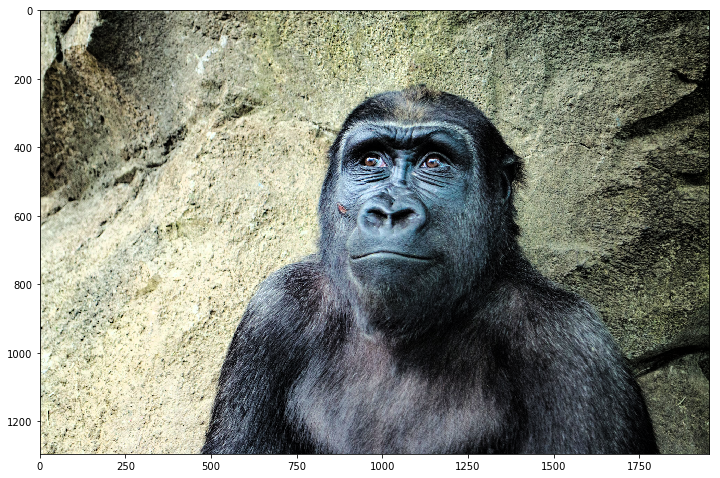

In [116]:
display_img(eq_color_gorilla)

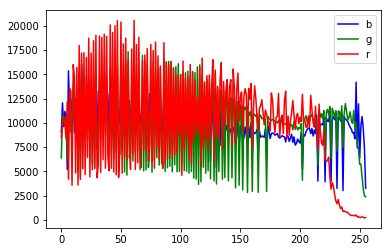

In [117]:
show_histo_bgr_mask(eq_color_gorilla)